# Descriptografia

In [ ]:
from Crypto.PublicKey import RSA
from Crypto.Cipher import PKCS1_OAEP
import numpy as np
import base64
import os
import time
import pydicom
import matplotlib.pyplot as plt

In [ ]:
with open("private.pem", "rb") as priv_file:
    private_key = RSA.import_key(priv_file.read())

cipher = PKCS1_OAEP.new(private_key)

chunk_size = 512

tempos_execucao = []
execucoes = []

for rodagem in range(218, 300):
    inicio = time.perf_counter()
    
    decrypted_chunks = []

    with open(f"crypto_metrics/imagem_criptografada_{rodagem}.enc", "rb") as enc_file:
        encrypted_data = base64.b64decode(enc_file.read())
        
    for i in range(0, len(encrypted_data), chunk_size):
        chunk = encrypted_data[i : i + chunk_size]
        decrypted_chunk = cipher.decrypt(chunk)
        decrypted_chunks.append(decrypted_chunk)

    decrypted_data = b"".join(decrypted_chunks)
    os.makedirs(os.path.dirname('decrypt_metrics'), exist_ok=True)
    with open(f"decrypt_metrics/imagem_descriptografada_{rodagem}.dcm", "wb") as img_file:
        img_file.write(decrypted_data)

    fim = time.perf_counter()
    tempo_execucao = fim - inicio
    tempos_execucao.append(tempo_execucao)
    execucoes.append(rodagem)

    print(f'Descriptografia finalizada: arquivo {rodagem}')
    print(f"Tempo de execução: {tempo_execucao:.5f} segundos\n")

print(f'\nTempo médio de execução: {np.mean(tempos_execucao):.5f}')

Descriptografia finalizada: arquivo 218
Tempo de execução: 14.76926 segundos

Descriptografia finalizada: arquivo 219
Tempo de execução: 14.63882 segundos

Descriptografia finalizada: arquivo 220
Tempo de execução: 14.87246 segundos

Descriptografia finalizada: arquivo 221
Tempo de execução: 14.56242 segundos

Descriptografia finalizada: arquivo 222
Tempo de execução: 14.69631 segundos

Descriptografia finalizada: arquivo 223
Tempo de execução: 14.56277 segundos

Descriptografia finalizada: arquivo 224
Tempo de execução: 14.54203 segundos

Descriptografia finalizada: arquivo 225
Tempo de execução: 15.06103 segundos

Descriptografia finalizada: arquivo 226
Tempo de execução: 14.66804 segundos

Descriptografia finalizada: arquivo 227
Tempo de execução: 14.52929 segundos

Descriptografia finalizada: arquivo 228
Tempo de execução: 14.92385 segundos

Descriptografia finalizada: arquivo 229
Tempo de execução: 14.46514 segundos

Descriptografia finalizada: arquivo 230
Tempo de execução: 14.57

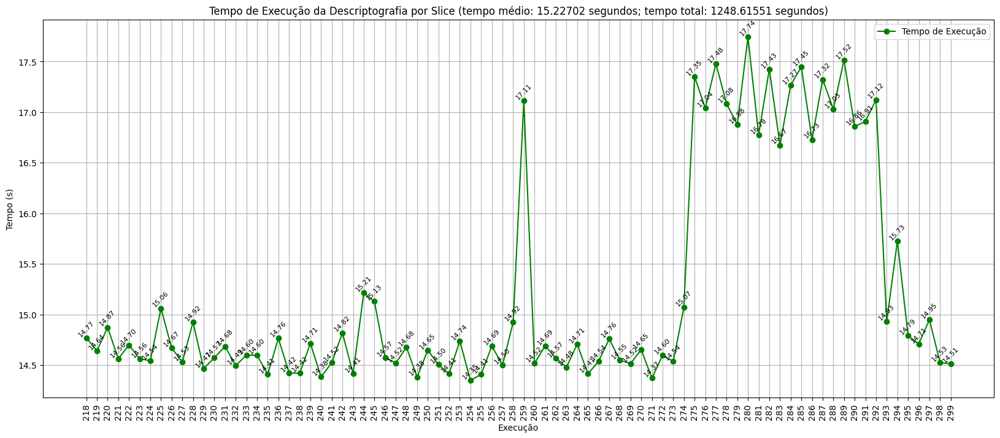

In [73]:
plt.figure(figsize=(20, 8))
plt.plot(execucoes, tempos_execucao, marker='o', linestyle='-', color='g', label='Tempo de Execução')

for x, y in zip(execucoes, tempos_execucao):
    plt.text(x, y + 0.002, f'{y:.2f}', ha='center', va='bottom', fontsize=8, rotation=45)

plt.xticks(execucoes, rotation=90)
plt.xlabel('Execução')
plt.ylabel('Tempo (s)')
plt.title(f'Tempo de Execução da Descriptografia por Slice (tempo médio: {np.mean(tempos_execucao):.5f} segundos; tempo total: {np.sum(tempos_execucao):.5f} segundos)')
plt.legend()
plt.grid(True)

plt.savefig('output_images/tempo_execucao_descriptografia.png')

plt.show()

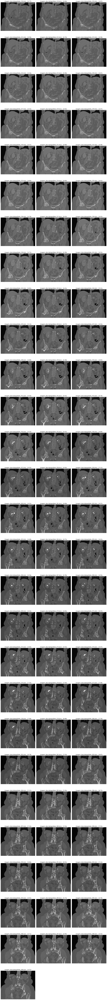

In [74]:
folder_path = r"C:\Users\CarlosChinen\OneDrive\Main\FEI\TCC\Criptografia\rsa_sha3\decrypt_metrics"

dicom_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(".dcm")]

# Número de imagens
n = len(dicom_files)
cols = 3
rows = (n + cols - 1) // cols

plt.figure(figsize=(15, 5 * rows))

for i, path in enumerate(dicom_files):
    ds = pydicom.dcmread(path)
    plt.subplot(rows, cols, i + 1)
    plt.imshow(ds.pixel_array, cmap="gray")
    plt.axis('off')
    plt.title(f"{os.path.basename(path)} - {tempos_execucao[i]:.2f}s")

plt.tight_layout()
plt.show()